# Extended percentile filtering

In [1]:
# import modules

# basics
import os, glob, sys
import warnings
from timeit import default_timer as timer
import matplotlib.pyplot as plt
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import geopandas as gp

# # fitting
from scipy import signal
from scipy.stats import iqr
import matplotlib.pylab

# Bezier and B-splines
from scipy.interpolate import LSQUnivariateSpline, UnivariateSpline

# import own functions 
# sys.path.append('my_functions')
# from polyfit_functions import *
# from eigenvalues_numba import *

## set up

In [2]:
# load in gdf
gdf = gp.read_file(f'../data/beams/SGM/SAF_20220901_DEMs_GT3R_intp.shp')

Mean point density: 2.96 points per m


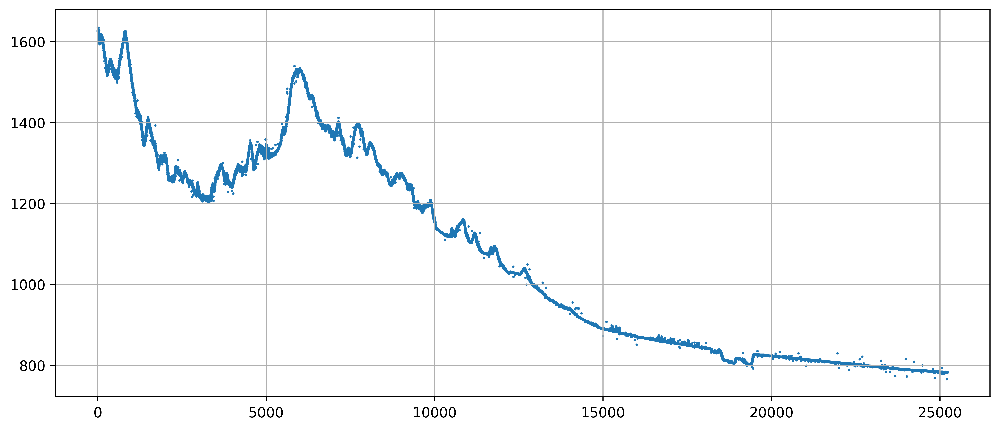

In [3]:
# extract photon ATD and elevation
xz = gdf[['alongtrack', 'PhH_navd88']].to_numpy()

fig, ax = plt.subplots(figsize=(12,5))
fig.set_dpi(500)
ax.scatter(xz[:,0], xz[:,1], s=0.5);
ax.grid()

# ax.set_xlim(16900,18000);
# ax.set_ylim(808,840);

print(f'Mean point density: {len(xz)/xz[-1,0]:.2f} points per m')

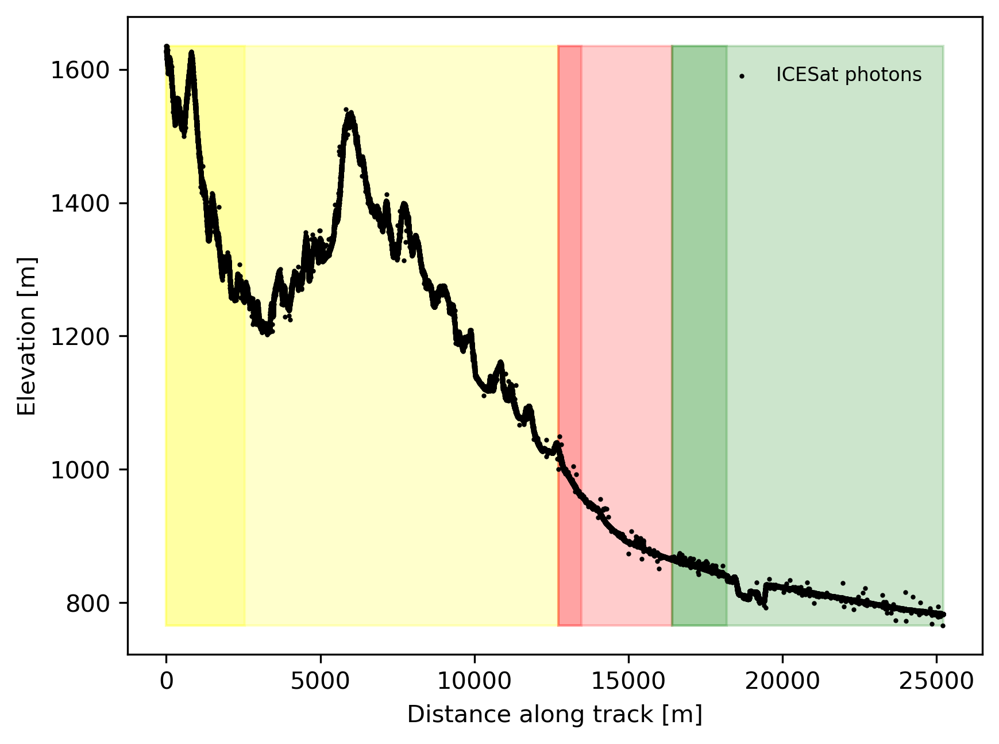

In [32]:
from matplotlib import patches

fig, ax = plt.subplots()
fig.set_dpi(300)

rect1 = patches.Rectangle((0,xz[:,1].min()), int(xz[38273,0]), xz[:,1].max()-xz[:,1].min(), color='yellow', alpha=0.2);
ax.add_patch(rect1);

rect11 = patches.Rectangle((0,xz[:,1].min()), int(xz[38273,0])*0.2, xz[:,1].max()-xz[:,1].min(), color='yellow', alpha=0.2);
ax.add_patch(rect11);

rect2 = patches.Rectangle((int(xz[38273,0]),xz[:,1].min()), int(xz[47851,0])-int(xz[38273,0]), xz[:,1].max()-xz[:,1].min(), color='red', alpha=0.2);
ax.add_patch(rect2);
rect22 = patches.Rectangle((int(xz[38273,0]),xz[:,1].min()), (int(xz[47851,0])-int(xz[38273,0]))*0.2, xz[:,1].max()-xz[:,1].min(), color='red', alpha=0.2);
ax.add_patch(rect22);

rect3 = patches.Rectangle((int(xz[47851,0]),xz[:,1].min()), xz[-1,0]-int(xz[47851,0]), xz[:,1].max()-xz[:,1].min(), color='green', alpha=0.2);
ax.add_patch(rect3);
rect33 = patches.Rectangle((int(xz[47851,0]),xz[:,1].min()), (xz[-1,0]-int(xz[47851,0]))*0.2, xz[:,1].max()-xz[:,1].min(), color='green', alpha=0.2);
ax.add_patch(rect33);

ax.scatter(xz[:,0], xz[:,1], c='k', s=1, label='ICESat photons');

#ax.scatter(xz[ground,0], xz[ground,1], c='m', s=0.5, label='Ground photons');
ax.set_ylabel('Elevation [m]')
ax.set_xlabel('Distance along track [m]')
ax.legend(fontsize=8, frameon=False, loc='upper right', bbox_to_anchor=(0.95,0.95));

plt.savefig('../writing/img/swath_regions_noground_percentiles.png', bbox_inches='tight')

In [10]:
# define landscape cutoff points
cutoff_mtns = int(xz[np.where(xz[:,0] >= 12700)[0][0],0])
cutoff_fhills = int(xz[np.where(xz[:,0] >= 16400)[0][0],0])
cutoff_plains = int(xz[-1,0])

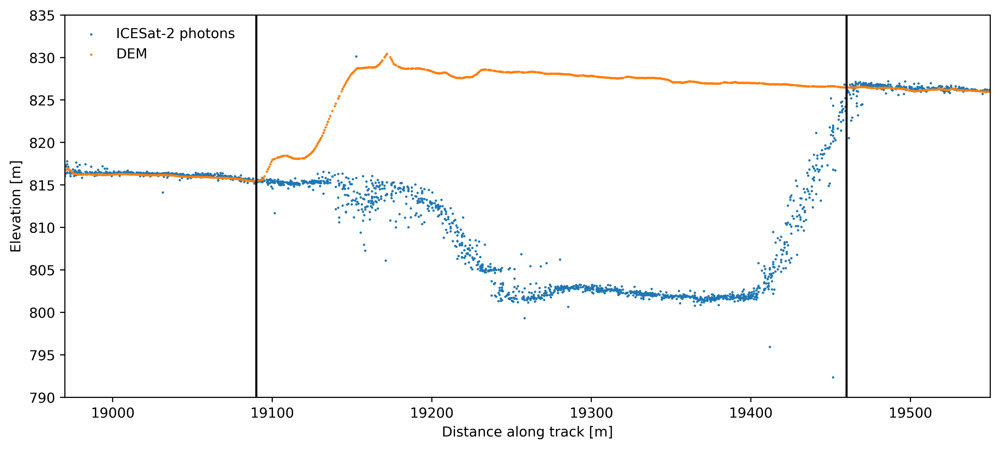

In [6]:
# quarry

fig, ax = plt.subplots(figsize=(12,5))
fig.set_dpi(500)
ax.scatter(xz[:,0], xz[:,1], s=0.5, label='ICESat-2 photons');

ax.scatter(gdf.alongtrack, gdf.dem_1m_nav,s=0.5, label='DEM');
#ax.grid()
ax.legend(loc='upper left', frameon=False)

ax.set_xlim(18970,19550);
ax.set_ylim(790,835);
ax.vlines(19090,790,835, colors='k');
ax.vlines(19460,790,835, colors='k');

ax.set_ylabel('Elevation [m]')
ax.set_xlabel('Distance along track [m]');

plt.savefig('../writing/img/quarry.png', bbox_inches='tight', dpi=300)

## loop: percentile filtering on 10 m bins

### extract percentile filtered photons and write to shapefiles

In [19]:
# datasets

# mountains training/test
#array_train = np.arange(0 + (cutoff_mtns-0)*0.2, cutoff_mtns, 5)
#array_test = np.arange(0, (cutoff_mtns-0)*0.2, 5)

# foothills training/test
#array_train = np.arange(cutoff_mtns + (cutoff_fhills-cutoff_mtns)*0.2, cutoff_fhills, 5)
#array_test = np.arange(cutoff_mtns, cutoff_mtns+(cutoff_fhills-cutoff_mtns)*0.2, 5)

# plains training/test
#array_train = np.arange(cutoff_fhills + (cutoff_plains-cutoff_fhills)*0.2, cutoff_plains, 5)
array_test = np.arange(cutoff_fhills,cutoff_fhills+(cutoff_plains-cutoff_fhills)*0.2, 5)

# all
#array_train = np.arange(0,cutoff_plains,5)


# extract
empty_xz = []
percentages = np.arange(5,95,5)
for p in percentages:
    filtered_ind_gr = []
    filtered_ind_gr_i = []
    for count, i in enumerate(array_test):
    #for count, i in enumerate(array_train):
    # subset the icesat beam and apply scaling factor
        sub_ii, = np.where((xz[:,0] >= i) & (xz[:,0] < i+10))
        xz_bin = xz[sub_ii,:]
        if xz_bin.any():
            xz_detrend = signal.detrend(xz_bin[:,1])
            ind_ground, = np.where((xz_detrend > np.nanpercentile(xz_detrend, 0.5)) & (xz_detrend < np.nanpercentile(xz_detrend, p)))
            # filtered_ind_gr.append(ind_ground+split_at[i-1]+start_ind)
            filtered_ind_gr.append(sub_ii[ind_ground])
        else:
            empty_xz.append(count)
    df_ind_gr = np.unique(np.concatenate(filtered_ind_gr)) 
    gdfx = gdf.iloc[df_ind_gr]

    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=UserWarning)
        gdfx.to_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{p}_plains_test.shp')

### error metrics of ground from loop

#### check for normal distribution

85th percentile
Median diff: 0.08 m
Max diff: 27.62 m
Min diff: -16.10 m

75th percentile
Median diff: 0.21 m
Max diff: 27.62 m
Min diff: -10.88 m

65th percentile
Median diff: 0.33 m
Max diff: 27.62 m
Min diff: -10.27 m

55th percentile
Median diff: 0.48 m
Max diff: 27.62 m
Min diff: -8.16 m

45th percentile
Median diff: 0.65 m
Max diff: 27.62 m
Min diff: -8.16 m

35th percentile
Median diff: 0.86 m
Max diff: 27.62 m
Min diff: -6.12 m

25th percentile
Median diff: 1.17 m
Max diff: 27.62 m
Min diff: -3.29 m

15th percentile
Median diff: 1.64 m
Max diff: 27.62 m
Min diff: -2.92 m

5th percentile
Median diff: 2.39 m
Max diff: 27.62 m
Min diff: -2.26 m



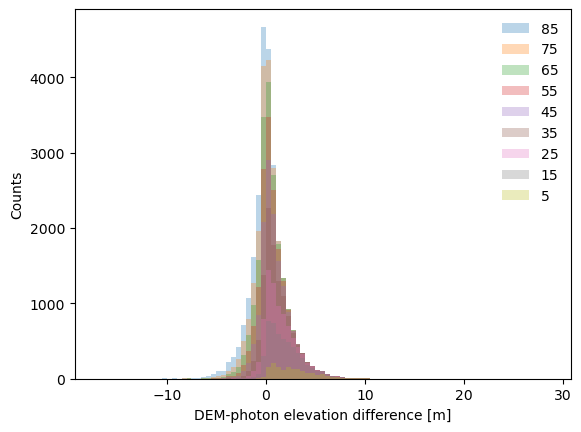

In [80]:
percentages = np.arange(5,95,10)[::-1]
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_train.shp')
    diff = gdf1.dem_1m_nav - gdf1.PhH_navd88
    plt.hist(diff, bins=np.arange(np.floor(np.min(diff)), np.ceil(np.max(diff))+1, 0.5), label=f'{i}', alpha=0.3)
    plt.xlabel('DEM-photon elevation difference [m]')
    plt.ylabel('Counts')
    print(f'{i}th percentile')
    print(f'Median diff: {np.median(diff):.2f} m')
    print(f'Max diff: {np.max(diff):.2f} m')
    print(f'Min diff: {np.min(diff):.2f} m\n')
plt.legend(frameon=False);

### combined MdSE photons

Upper percentile of 5:
Mountains: Photons MdSE = 5.713, Spline MdSE = 6.436
           Photons IQR = 2.988, Spline IQR = 4.281
Foothills: Photons MdSE = 0.061, Spline MdSE = 0.068
           Photons IQR = 0.385, Spline IQR = 0.348
Plains:    Photons MdSE = 0.141, Spline MdSE = 0.157
           Photons IQR = 0.280, Spline IQR = 0.260
Combined:  Photons MdSE = 0.379, Spline Mean MdSE = 2.220
           Photons IQR = 2.181, Spline Mean IQR = 1.629

Upper percentile of 10:
Mountains: Photons MdSE = 3.938, Spline MdSE = 4.417
           Photons IQR = 2.640, Spline IQR = 2.475
Foothills: Photons MdSE = 0.036, Spline MdSE = 0.037
           Photons IQR = 0.336, Spline IQR = 0.330
Plains:    Photons MdSE = 0.105, Spline MdSE = 0.115
           Photons IQR = 0.291, Spline IQR = 0.271
Combined:  Photons MdSE = 0.265, Spline Mean MdSE = 1.523
           Photons IQR = 1.856, Spline Mean IQR = 1.025

Upper percentile of 15:
Mountains: Photons MdSE = 2.734, Spline MdSE = 3.139
           Photons IQR

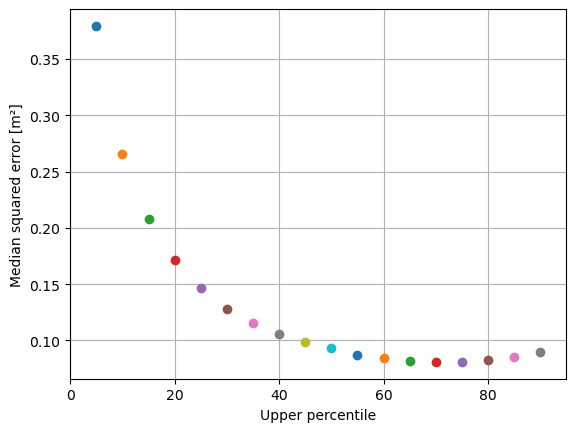

In [82]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_train.shp')
    diff1 = gdf1.dem_1m_nav - gdf1.PhH_navd88
    # spline
    t = np.arange(gdf1.alongtrack.iloc[0]+1, gdf1.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf1.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf1.alongtrack, gdf1.PhH_navd88, t)
    diff_spl1 = gdf1.dem_1m_nav - spl(gdf1.alongtrack)
    mdse_spl1 = np.nanmedian((diff_spl1)**2)
    
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_fhills_train.shp')
    diff2 = gdf2.dem_1m_nav - gdf2.PhH_navd88
    # spline
    t = np.arange(gdf2.alongtrack.iloc[0]+1, gdf2.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf2.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf2.alongtrack, gdf2.PhH_navd88, t)
    diff_spl2 = gdf2.dem_1m_nav - spl(gdf2.alongtrack)
    mdse_spl2 = np.nanmedian((diff_spl2)**2)
    
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_train.shp')
    # gdf3 = gdf3.drop(index=np.where((gdf3.alongtrack >19090) & (gdf3.alongtrack < 19460))[0])
    # spline
    t = np.arange(gdf3.alongtrack.iloc[0]+1, gdf3.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf3.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf3.alongtrack, gdf3.PhH_navd88, t)
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains.shp')
    gdf3 = gdf3.drop(index=np.where((gdf3.alongtrack >19090) & (gdf3.alongtrack < 19460))[0])
    diff_spl3 = gdf3.dem_1m_nav - spl(gdf3.alongtrack)
    mdse_spl3 = np.nanmedian((diff_spl3)**2) 
    # mdse_spl3 = iqr(diff_spl3) 
    diff3 = gdf3.dem_1m_nav - gdf3.PhH_navd88
    
    print(f'Upper percentile of {i}:')
    print(f'Mountains: Photons MdSE = {np.nanmedian((diff1)**2):.3f}, Spline MdSE = {mdse_spl1:.3f}')
    print(f'           Photons IQR = {iqr(diff1):.3f}, Spline IQR = {iqr(diff_spl1):.3f}')
    print(f'Foothills: Photons MdSE = {np.nanmedian((diff2)**2):.3f}, Spline MdSE = {mdse_spl2:.3f}')
    print(f'           Photons IQR = {iqr(diff2):.3f}, Spline IQR = {iqr(diff_spl2):.3f}')
    print(f'Plains:    Photons MdSE = {np.nanmedian((diff3)**2):.3f}, Spline MdSE = {mdse_spl3:.3f}')
    print(f'           Photons IQR = {iqr(diff3):.3f}, Spline IQR = {iqr(diff_spl3):.3f}')

    # combine
    gdf_n = gp.GeoDataFrame(pd.concat([gdf1, gdf2, gdf3], ignore_index=True, axis=0))
    diff = gdf_n.dem_1m_nav - gdf_n.PhH_navd88
    print(f'Combined:  Photons MdSE = {np.nanmedian((diff)**2):.3f}, Spline Mean MdSE = {np.mean([mdse_spl1,mdse_spl2,mdse_spl3]):.3f}')
    print(f'           Photons IQR = {iqr(diff):.3f}, Spline Mean IQR = {np.mean([iqr(diff_spl1),iqr(diff_spl2),iqr(diff_spl3)]):.3f}\n')
    x = i
    y = np.nanmedian((diff)**2)
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('Median squared error [m²]')
matplotlib.pylab.xlabel('Upper percentile')

#plt.savefig('../writing/img/training_percentile_photons.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()

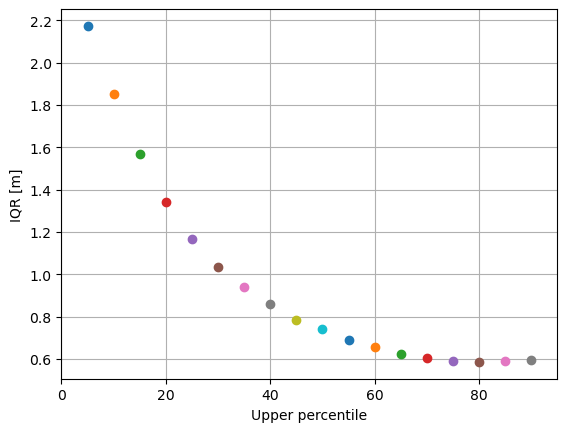

In [68]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_train.shp')
    
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_fhills_train.shp')
    
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_train.shp')
    gdf3 = gdf3.drop(index=np.where((gdf3.alongtrack >19090) & (gdf3.alongtrack < 19460))[0])

    # combine
    gdf_n = gp.GeoDataFrame(pd.concat([gdf1, gdf2, gdf3], ignore_index=True, axis=0))
    diff = gdf_n.dem_1m_nav - gdf_n.PhH_navd88
    x = i
    y = iqr(diff)
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('IQR [m]')
matplotlib.pylab.xlabel('Upper percentile')

plt.savefig('../writing/img/training_percentile_photons_iqr.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()

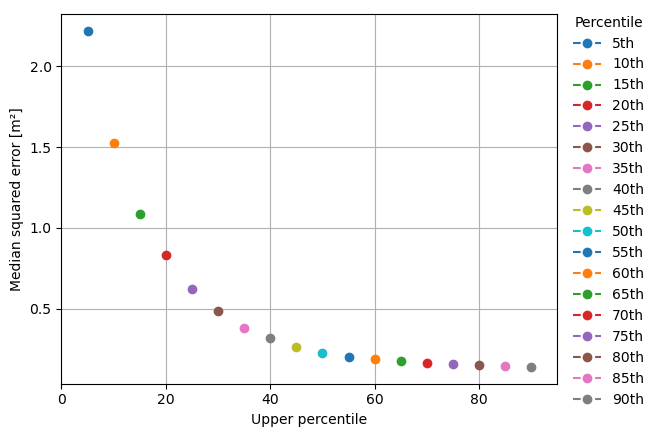

In [69]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_train.shp')
    diff1 = gdf1.dem_1m_nav - gdf1.PhH_navd88
    # spline
    t = np.arange(gdf1.alongtrack.iloc[0]+1, gdf1.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf1.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf1.alongtrack, gdf1.PhH_navd88, t)
    diff_spl1 = gdf1.dem_1m_nav - spl(gdf1.alongtrack)
    mdse_spl1 = np.nanmedian((diff_spl1)**2)
    
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_fhills_train.shp')
    diff2 = gdf2.dem_1m_nav - gdf2.PhH_navd88
    # spline
    t = np.arange(gdf2.alongtrack.iloc[0]+1, gdf2.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf2.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf2.alongtrack, gdf2.PhH_navd88, t)
    diff_spl2 = gdf2.dem_1m_nav - spl(gdf2.alongtrack)
    mdse_spl2 = np.nanmedian((diff_spl2)**2)
    
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_train.shp')
    t = np.arange(gdf3.alongtrack.iloc[0]+1, gdf3.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf3.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf3.alongtrack, gdf3.PhH_navd88, t)
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_train.shp')
    gdf3 = gdf3.drop(index=np.where((gdf3.alongtrack >19090) & (gdf3.alongtrack < 19460))[0])
    diff_spl3 = gdf3.dem_1m_nav - spl(gdf3.alongtrack)
    mdse_spl3 = np.nanmedian((diff_spl3)**2) 

    x = i
    y = np.mean([mdse_spl1,mdse_spl2,mdse_spl3])
    # y = diff
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('Median squared error [m²]')
matplotlib.pylab.xlabel('Upper percentile')

matplotlib.pylab.legend(loc='upper right', bbox_to_anchor=(1.2, 1.03), frameon=False, title="Percentile",)

plt.savefig('../writing/img/training_percentile_spline.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()



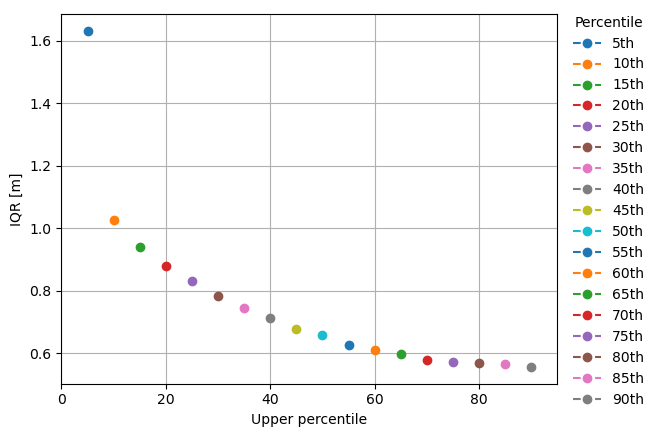

In [70]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_train.shp')
    diff1 = gdf1.dem_1m_nav - gdf1.PhH_navd88
    # spline
    t = np.arange(gdf1.alongtrack.iloc[0]+1, gdf1.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf1.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf1.alongtrack, gdf1.PhH_navd88, t)
    diff_spl1 = gdf1.dem_1m_nav - spl(gdf1.alongtrack)
    
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_fhills_train.shp')
    diff2 = gdf2.dem_1m_nav - gdf2.PhH_navd88
    # spline
    t = np.arange(gdf2.alongtrack.iloc[0]+1, gdf2.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf2.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf2.alongtrack, gdf2.PhH_navd88, t)
    diff_spl2 = gdf2.dem_1m_nav - spl(gdf2.alongtrack)
    
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_train.shp')
    t = np.arange(gdf3.alongtrack.iloc[0]+1, gdf3.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf3.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf3.alongtrack, gdf3.PhH_navd88, t)
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_train.shp')
    gdf3 = gdf3.drop(index=np.where((gdf3.alongtrack >19090) & (gdf3.alongtrack < 19460))[0])
    diff_spl3 = gdf3.dem_1m_nav - spl(gdf3.alongtrack)

    x = i
    y = np.mean([iqr(diff_spl1),iqr(diff_spl2),iqr(diff_spl3)])
    # y = diff
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('IQR [m]')
matplotlib.pylab.xlabel('Upper percentile')

matplotlib.pylab.legend(loc='upper right', bbox_to_anchor=(1.2, 1.03), frameon=False, title="Percentile",)

plt.savefig('../writing/img/training_percentile_spline_iqr.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()

### landscapes

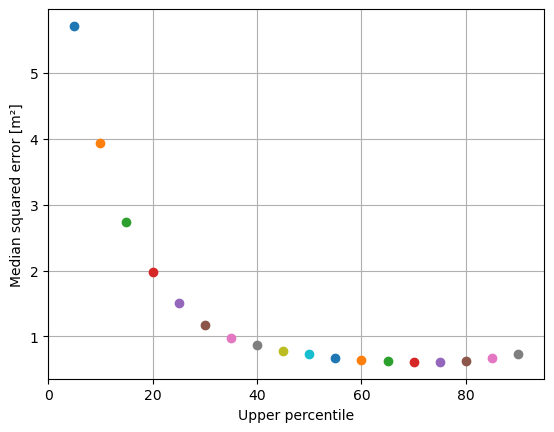

In [71]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_train.shp')
    diff1 = gdf1.dem_1m_nav - gdf1.PhH_navd88
    
    x = i
    y = np.nanmedian((diff1)**2)
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('Median squared error [m²]')
matplotlib.pylab.xlabel('Upper percentile')

#matplotlib.pylab.legend(loc='upper right', bbox_to_anchor=(1.2, 1.03), frameon=False, title="Percentile",)

plt.savefig('../writing/img/training_percentile_mountains.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()

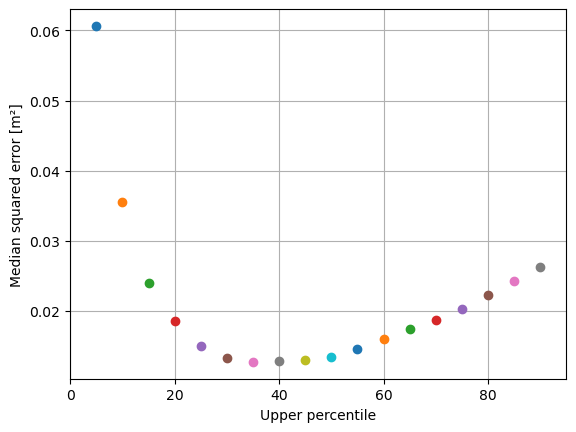

In [72]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_fhills_train.shp')
    diff1 = gdf1.dem_1m_nav - gdf1.PhH_navd88
    
    x = i
    y = np.nanmedian((diff1)**2)
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('Median squared error [m²]')
matplotlib.pylab.xlabel('Upper percentile')


plt.savefig('../writing/img/training_percentile_fhills.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()

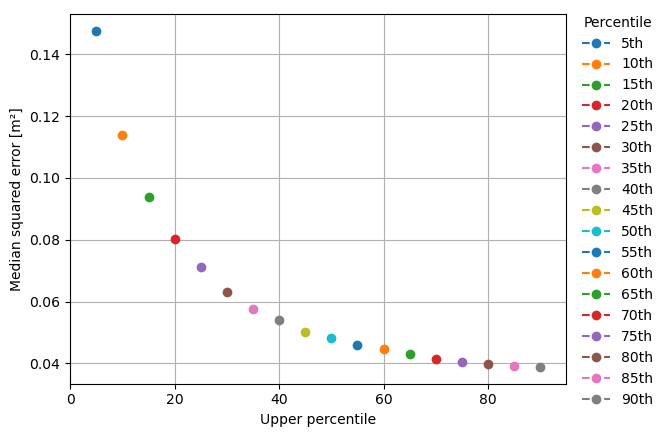

In [73]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_train.shp')
    gdf3 = gdf3.drop(index=np.where((gdf3.alongtrack >19090) & (gdf3.alongtrack < 19460))[0])
    diff1 = gdf1.dem_1m_nav - gdf1.PhH_navd88
    
    x = i
    y = np.nanmedian((diff1)**2)
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('Median squared error [m²]')
matplotlib.pylab.xlabel('Upper percentile')

matplotlib.pylab.legend(loc='upper right', bbox_to_anchor=(1.2, 1.03), frameon=False, title="Percentile",)

plt.savefig('../writing/img/training_percentile_plains.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()

### test data

In [8]:
percentages = np.arange(50,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_test.shp')
    diff1 = gdf1.dem_1m_nav - gdf1.PhH_navd88
    # spline
    t = np.arange(gdf1.alongtrack.iloc[0]+1, gdf1.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf1.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf1.alongtrack, gdf1.PhH_navd88, t)
    diff_spl1 = gdf1.dem_1m_nav - spl(gdf1.alongtrack)
    mdse_spl1 = np.nanmedian((diff_spl1)**2)
    
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_fhills_test.shp')
    diff2 = gdf2.dem_1m_nav - gdf2.PhH_navd88
    # spline
    t = np.arange(gdf2.alongtrack.iloc[0]+1, gdf2.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf2.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf2.alongtrack, gdf2.PhH_navd88, t)
    diff_spl2 = gdf2.dem_1m_nav - spl(gdf2.alongtrack)
    mdse_spl2 = np.nanmedian((diff_spl2)**2)
    
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_test.shp')
    t = np.arange(gdf3.alongtrack.iloc[0]+1, gdf3.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf3.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf3.alongtrack, gdf3.PhH_navd88, t)
    diff_spl3 = gdf3.dem_1m_nav - spl(gdf3.alongtrack)
    mdse_spl3 = np.nanmedian((diff_spl3)**2) 
    diff3 = gdf3.dem_1m_nav - gdf3.PhH_navd88

    print(f'Upper percentile of {i}:')
    print(f'Mountains: Photons MdSE = {np.nanmedian((diff1)**2):.3f}, Spline MdSE = {mdse_spl1:.3f}')
    print(f'Mountains: Photons IQR = {iqr(diff1):.3f}, Spline IQR = {iqr(diff_spl1):.3f}')
    print(f'Foothills: Photons MdSE = {np.nanmedian((diff2)**2):.3f}, Spline MdSE = {mdse_spl2:.3f}')
    print(f'Foothills: Photons IQR = {iqr(diff2):.3f}, Spline IQR = {iqr(diff_spl2):.3f}')
    print(f'Plains:    Photons MdSE = {np.nanmedian((diff3)**2):.3f}, Spline MdSE = {mdse_spl3:.3f}')
    print(f'Plains:    Photons IQR = {iqr(diff3):.3f}, Spline IQR = {iqr(diff_spl3):.3f}')

    # combine
    gdf_n = gp.GeoDataFrame(pd.concat([gdf1, gdf2, gdf3], ignore_index=True, axis=0))
    diff = gdf_n.dem_1m_nav - gdf_n.PhH_navd88
    print(f'Combined:  Photons MdSE = {np.nanmedian((diff)**2):.3f}, Spline Mean MdSE = {np.mean([mdse_spl1,mdse_spl2,mdse_spl3]):.3f}')
    print(f'Combined:  Photons IQR = {iqr(diff):.3f}, Spline Mean IQR = {np.mean([iqr(diff_spl1),iqr(diff_spl2),iqr(diff_spl3)]):.3f}\n')

Upper percentile of 50:
Mountains: Photons MdSE = 1.582, Spline MdSE = 0.814
Mountains: Photons IQR = 2.607, Spline IQR = 1.860
Foothills: Photons MdSE = 0.080, Spline MdSE = 0.060
Foothills: Photons IQR = 0.615, Spline IQR = 0.485
Plains:    Photons MdSE = 0.020, Spline MdSE = 0.014
Plains:    Photons IQR = 0.163, Spline IQR = 0.122
Combined:  Photons MdSE = 0.205, Spline Mean MdSE = 0.296
Combined:  Photons IQR = 1.074, Spline Mean IQR = 0.822

Upper percentile of 55:
Mountains: Photons MdSE = 1.616, Spline MdSE = 0.872
Mountains: Photons IQR = 2.638, Spline IQR = 1.912
Foothills: Photons MdSE = 0.069, Spline MdSE = 0.047
Foothills: Photons IQR = 0.606, Spline IQR = 0.487
Plains:    Photons MdSE = 0.023, Spline MdSE = 0.017
Plains:    Photons IQR = 0.166, Spline IQR = 0.117
Combined:  Photons MdSE = 0.211, Spline Mean MdSE = 0.312
Combined:  Photons IQR = 0.991, Spline Mean IQR = 0.839

Upper percentile of 60:
Mountains: Photons MdSE = 1.660, Spline MdSE = 0.848
Mountains: Photons IQ

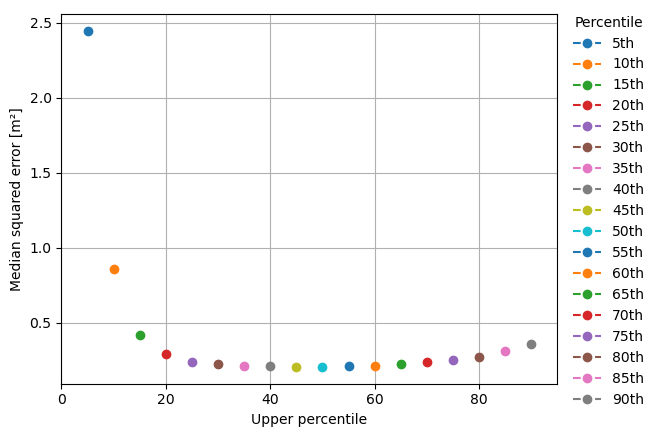

In [74]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf1 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_test.shp')
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_fhills_test.shp')
    gdf3 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_test.shp')
    gdf_n = gp.GeoDataFrame(pd.concat([gdf1, gdf2, gdf3], ignore_index=True, axis=0))
    diff = gdf_n.dem_1m_nav - gdf_n.PhH_navd88
    x = i
    y = np.nanmedian((diff)**2)
    # y = diff
    matplotlib.pylab.plot(x, y, 'o--', label=f'{i}th')

matplotlib.pylab.xlim(0,95)
matplotlib.pylab.grid()
matplotlib.pylab.ylabel('Median squared error [m²]')
matplotlib.pylab.xlabel('Upper percentile')

matplotlib.pylab.legend(loc='upper right', bbox_to_anchor=(1.2, 1.03), frameon=False, title="Percentile",)

plt.savefig('../writing/img/testing_percentile.png', bbox_inches='tight', dpi=300)
matplotlib.pylab.show()

## visual analysis

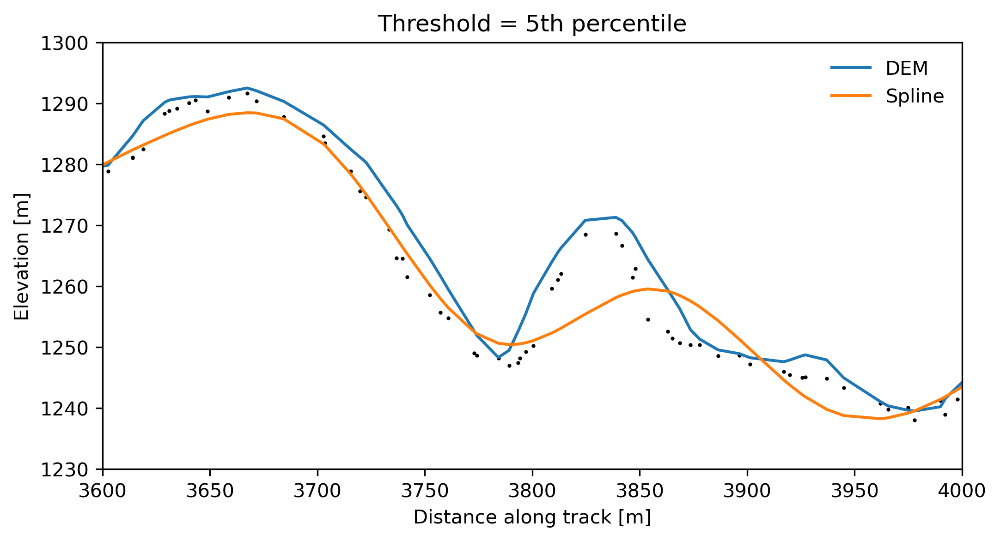

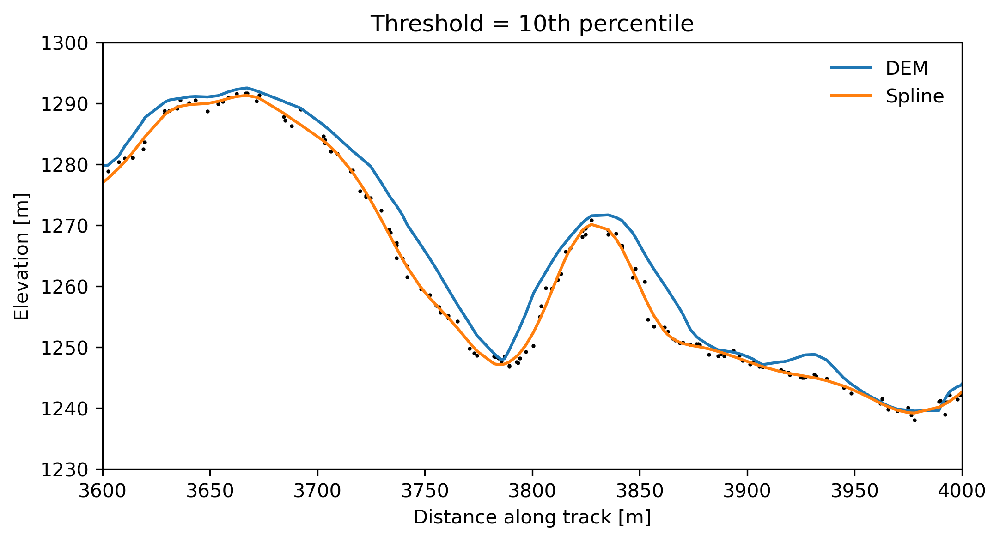

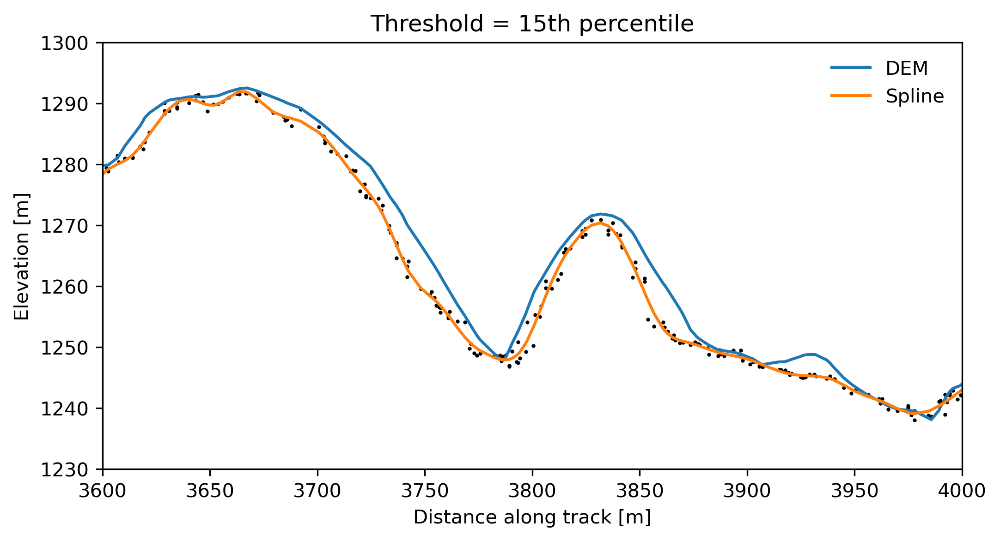

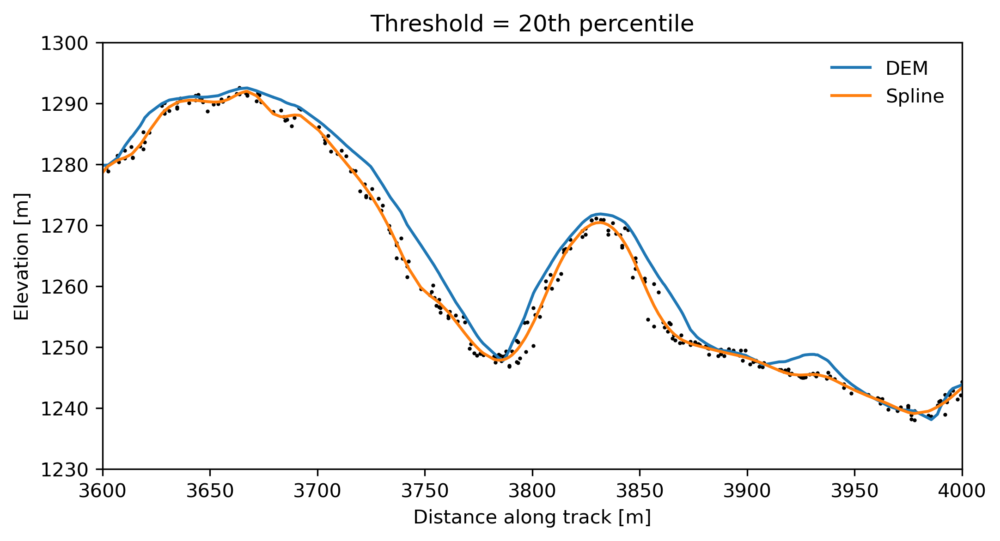

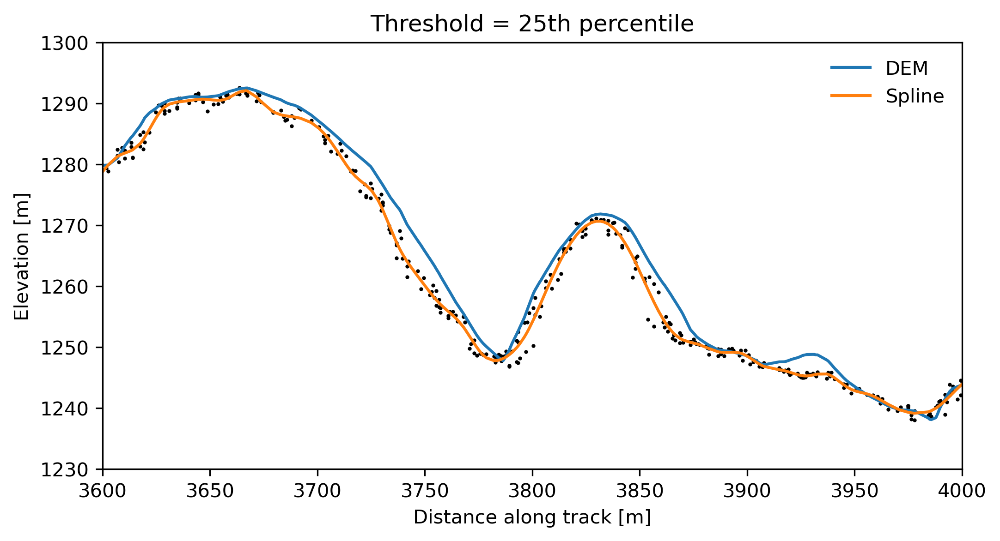

...

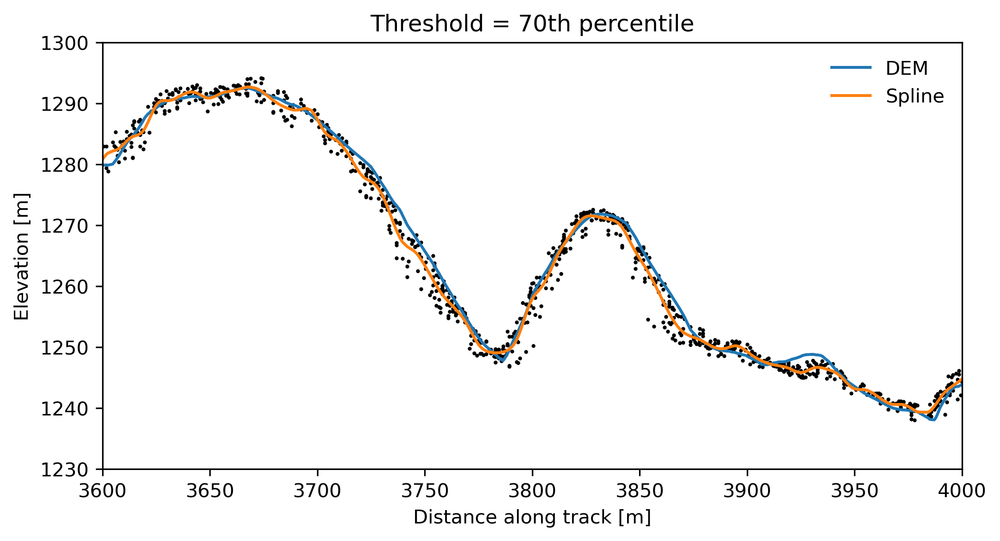

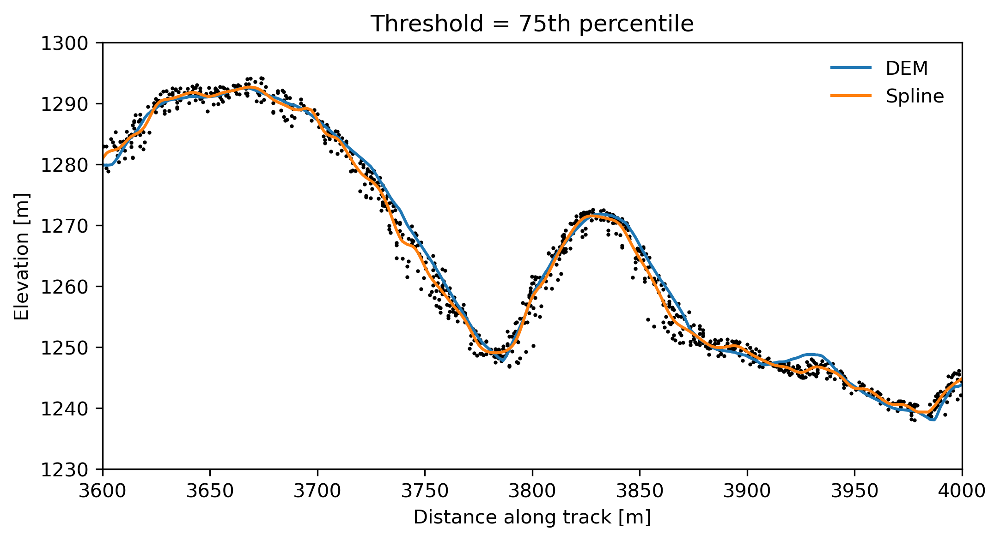

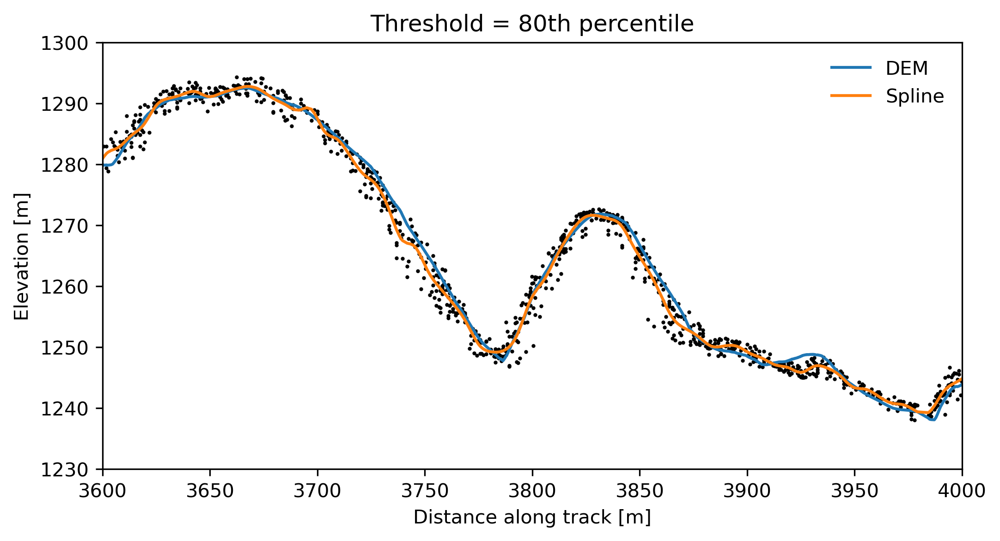

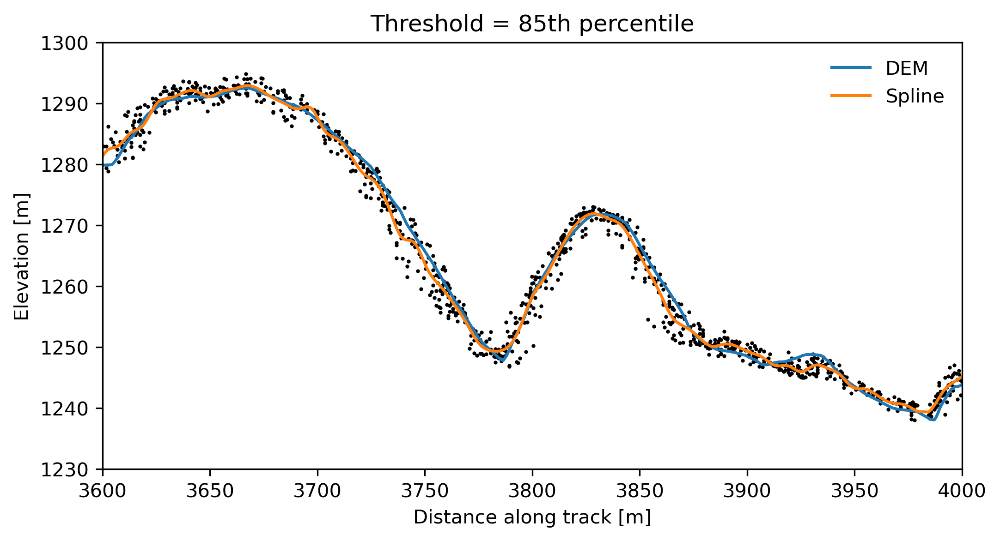

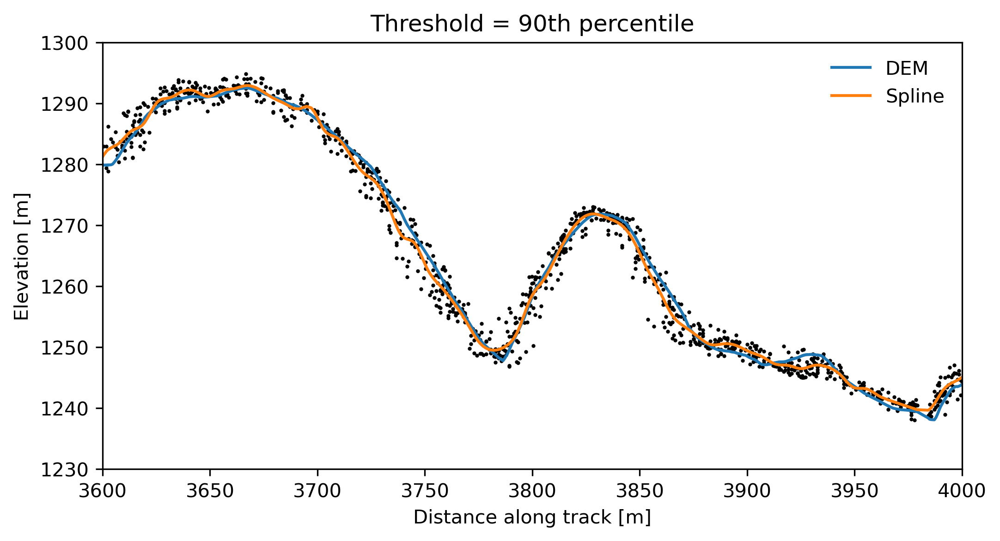

In [12]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_mtns_train.shp')
    fig, ax = plt.subplots(figsize=(8,4))
    ax.scatter(gdf2.alongtrack, gdf2.PhH_navd88, s=1, c='k');
    ax.plot(gdf2.alongtrack, gdf2.dem_1m_nav, label='DEM')

    t = np.arange(gdf2.alongtrack.iloc[0]+5, gdf2.alongtrack.iloc[-1]-5, np.ceil(np.max(np.diff(gdf2.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf2.alongtrack, gdf2.PhH_navd88, t)
    ax.plot(gdf2.alongtrack, spl(gdf2.alongtrack), label='Spline')
    ax.legend(frameon=False)
    ax.set_xlim(3600,4000);
    ax.set_ylim(1230,1300);
    ax.set_xlabel('Distance along track [m]')
    ax.set_ylabel('Elevation [m]')
    ax.set_title(f'Threshold = {i}th percentile');
    fig.set_dpi(300)

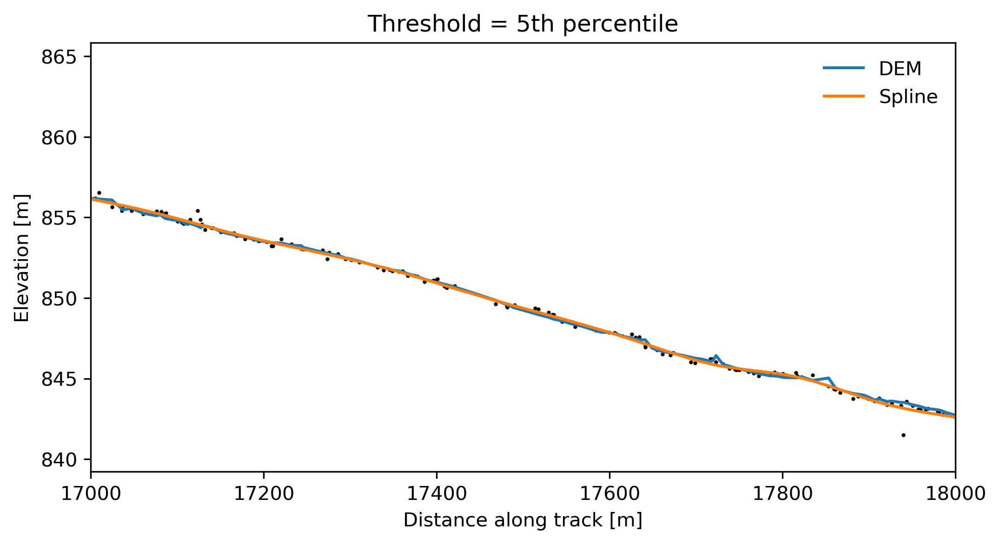

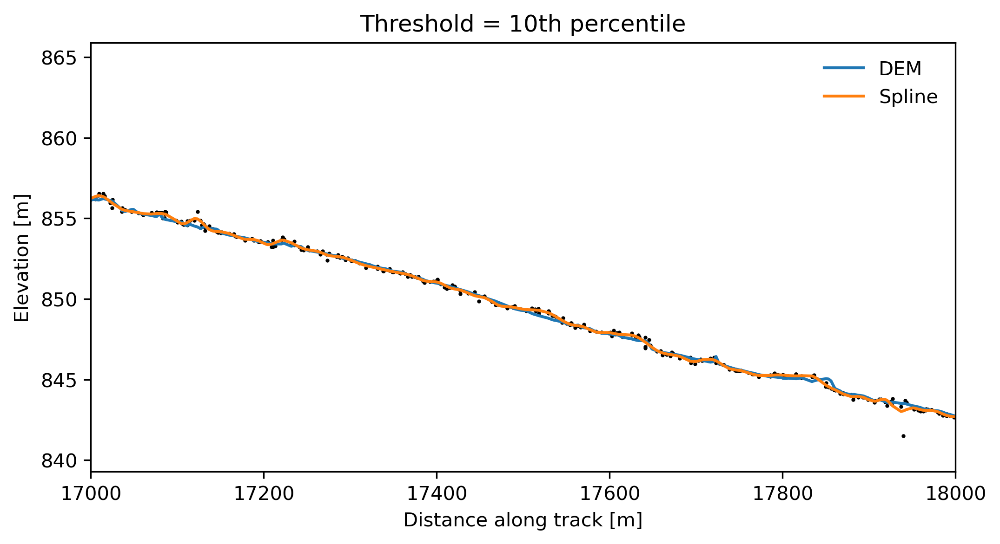

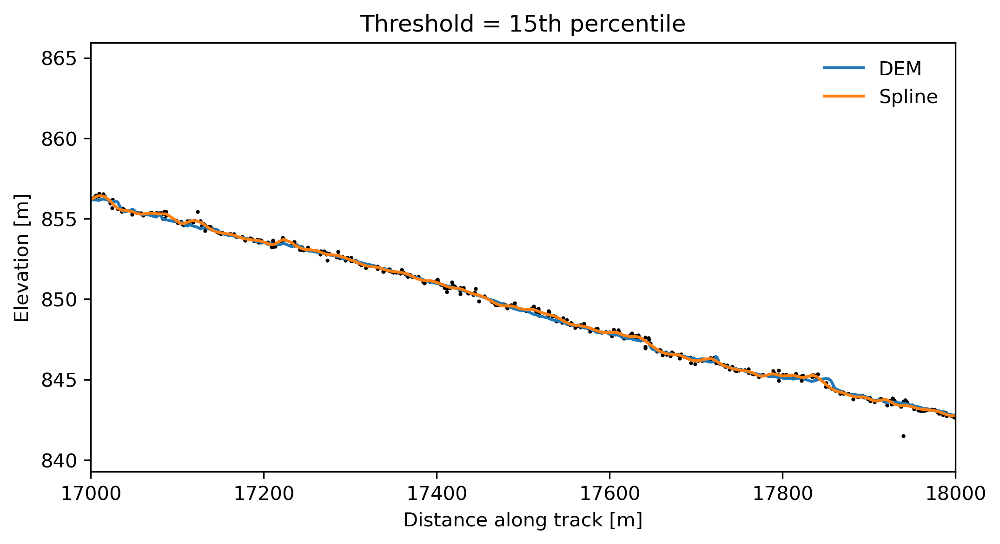

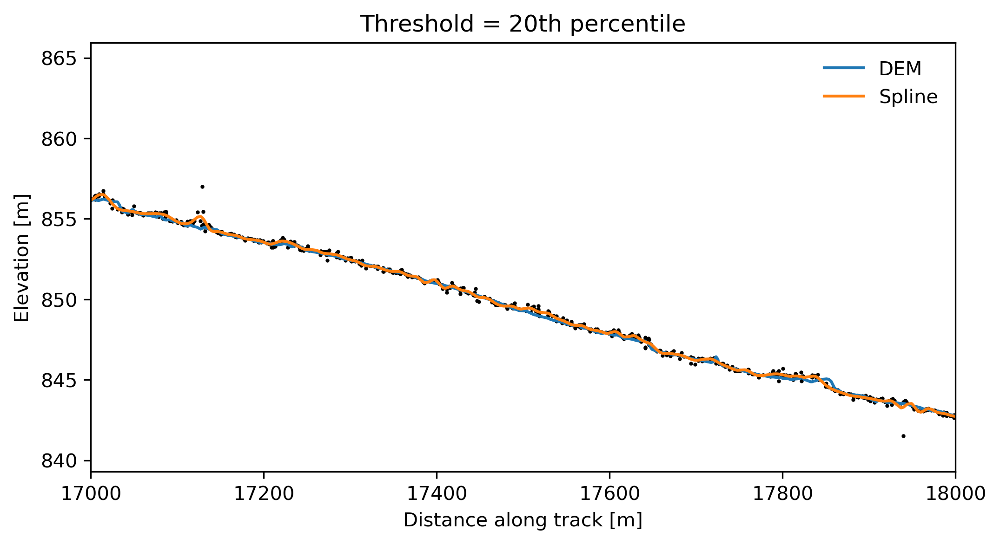

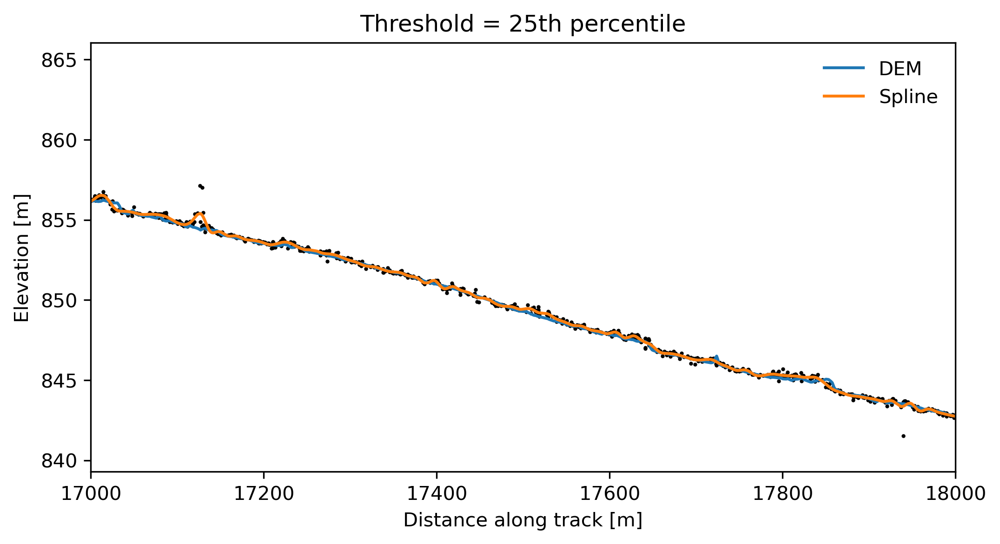

...

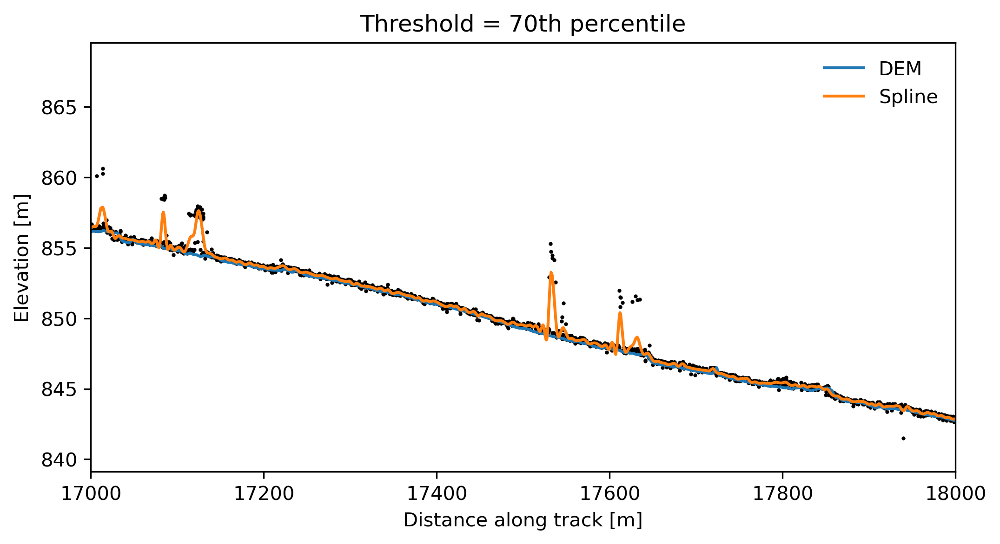

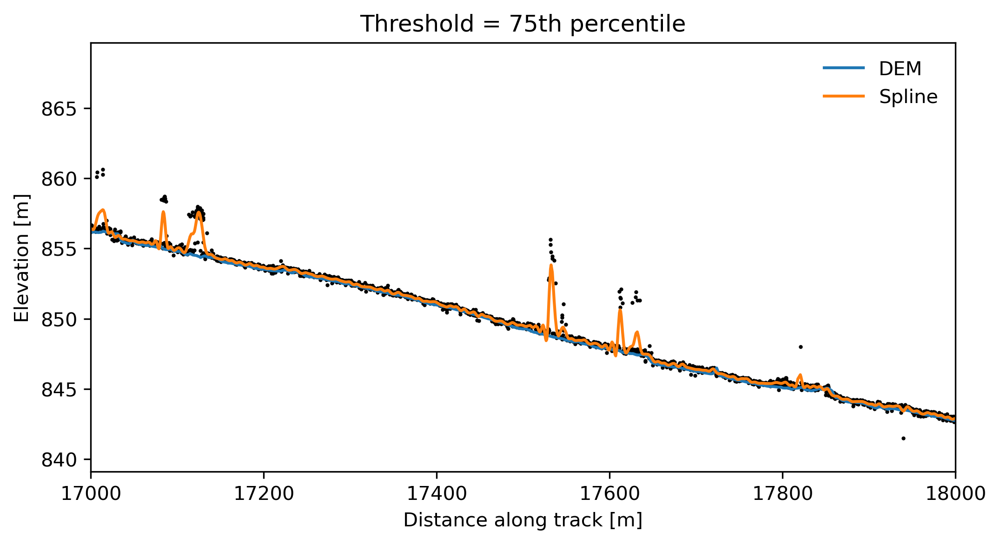

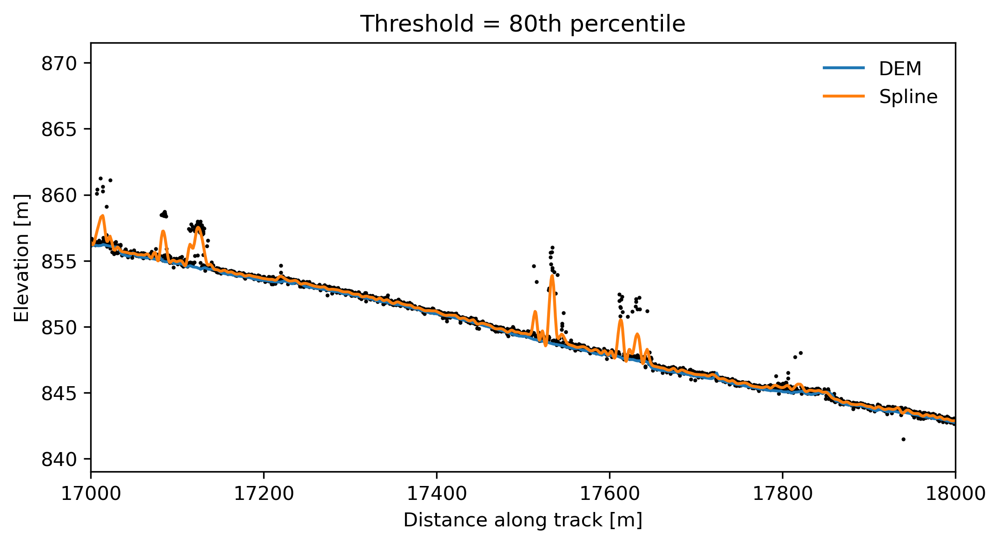

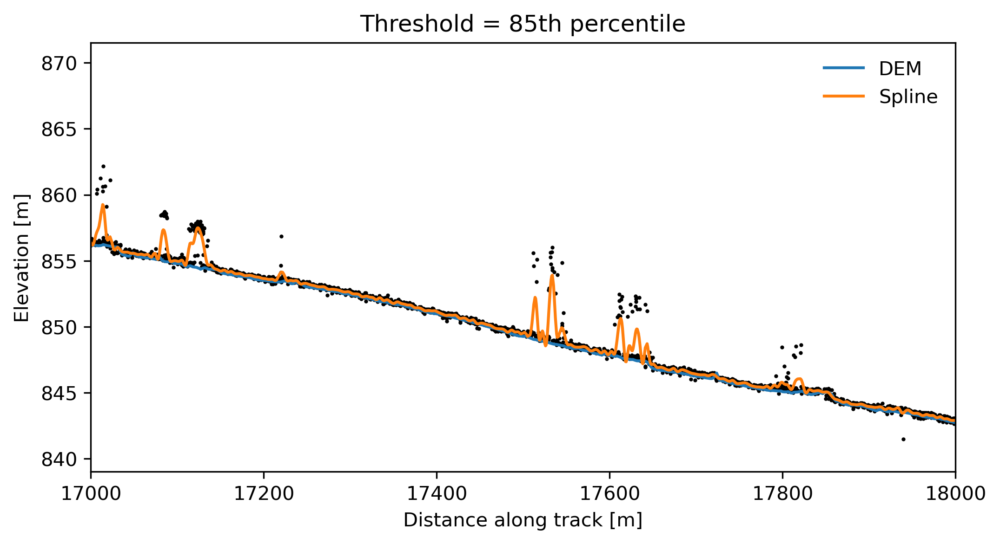

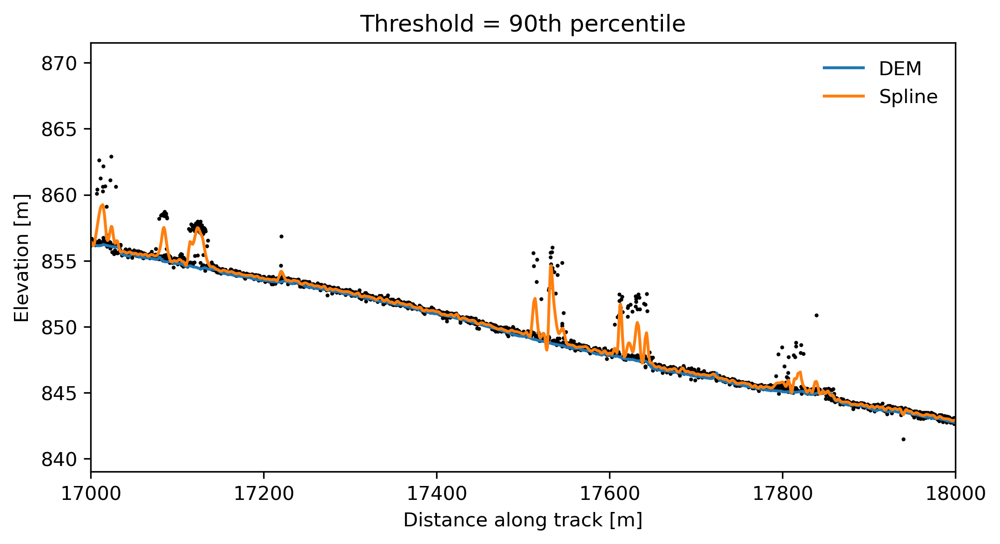

In [15]:
percentages = np.arange(5,95,5)
for i in percentages:
    gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p{i}_plains_test.shp')
    fig, ax = plt.subplots(figsize=(8,4))
    ax.scatter(gdf2.alongtrack, gdf2.PhH_navd88, s=1, c='k');
    ax.plot(gdf2.alongtrack, gdf2.dem_1m_nav, label='DEM')

    t = np.arange(gdf2.alongtrack.iloc[0]+5, gdf2.alongtrack.iloc[-1]-5, np.ceil(np.max(np.diff(gdf2.alongtrack)))).tolist()
    spl = LSQUnivariateSpline(gdf2.alongtrack, gdf2.PhH_navd88, t)
    ax.plot(gdf2.alongtrack, spl(gdf2.alongtrack), label='Spline')
    ax.legend(frameon=False)
    ax.set_xlim(17000,18000);
    #ax.set_ylim(840,860);
    ax.set_xlabel('Distance along track [m]')
    ax.set_ylabel('Elevation [m]')
    ax.set_title(f'Threshold = {i}th percentile');
    fig.set_dpi(300);

## reducing error in filtering process

### deriving slope (from DEM) and standard deviation of elevation

In [4]:
iter_array = np.arange(0, int(xz[-1,0]), 5)

elev_std = []
mean_slope = []
for i in iter_array:
    # subset the icesat beam and apply scaling factor
    sub_ii, = np.where((xz[:,0] >= i) & (xz[:,0] < i+10))
    xz_bin = xz[sub_ii,:]
    slope_bin = gdf.dem_1m_slp.iloc[sub_ii].values
    if xz_bin.any():
        elev_std.append(np.std(signal.detrend(xz_bin[:,1])))#
        mean_slope.append(np.mean(slope_bin)) # DEM slp
    else:
        elev_std.append(np.nan)
        mean_slope.append(np.nan)

elev_std = np.asarray(elev_std)
mean_slope = np.asarray(mean_slope)

#### visualization

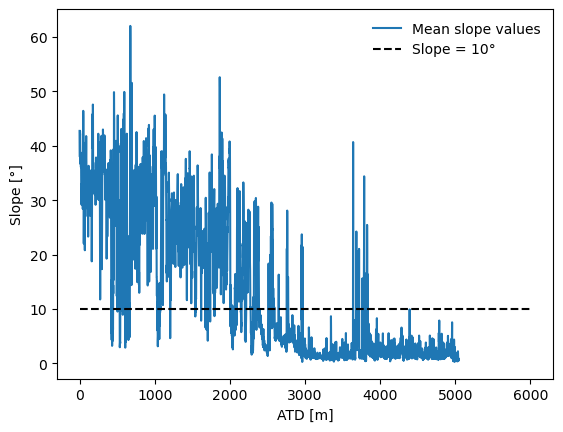

In [8]:
plt.plot(mean_slope, label='Mean slope values');
plt.hlines(10,0,6000, 'k', '--', label='Slope = 10°')
plt.legend(frameon=False)
plt.ylabel('Slope [°]')
plt.xlabel('ATD [m]');

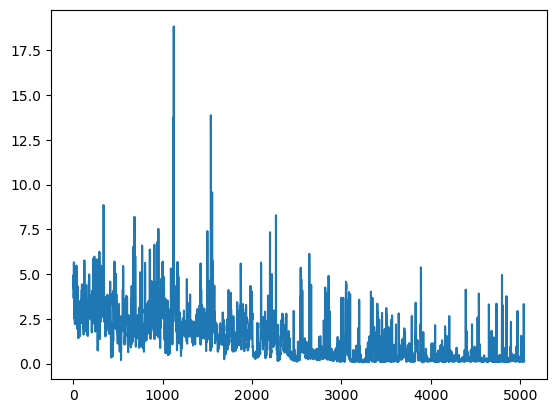

In [35]:
plt.plot(elev_std);

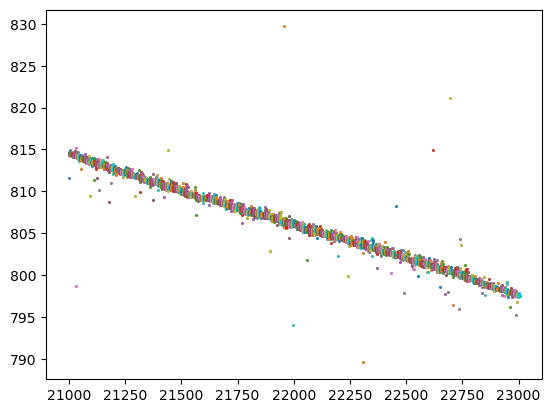

In [17]:
# flat area to determine good standard deviation of elevation threshold from

fig, ax = plt.subplots()
elev_range = []
for i in np.arange(21000,23000,5):
    sub_ii, = np.where((xz[:,0] >= i) & (xz[:,0] < i+10))
    xz_bin = xz[sub_ii,:]
    xz_detrend = signal.detrend(xz_bin[:,1])
    elev_range.append(xz_detrend.max()-xz_detrend.min())

    ax.scatter(xz_bin[:,0], (xz_bin[:,1]), s=1)

In [22]:
np.median(elev_range)

1.005869828617847

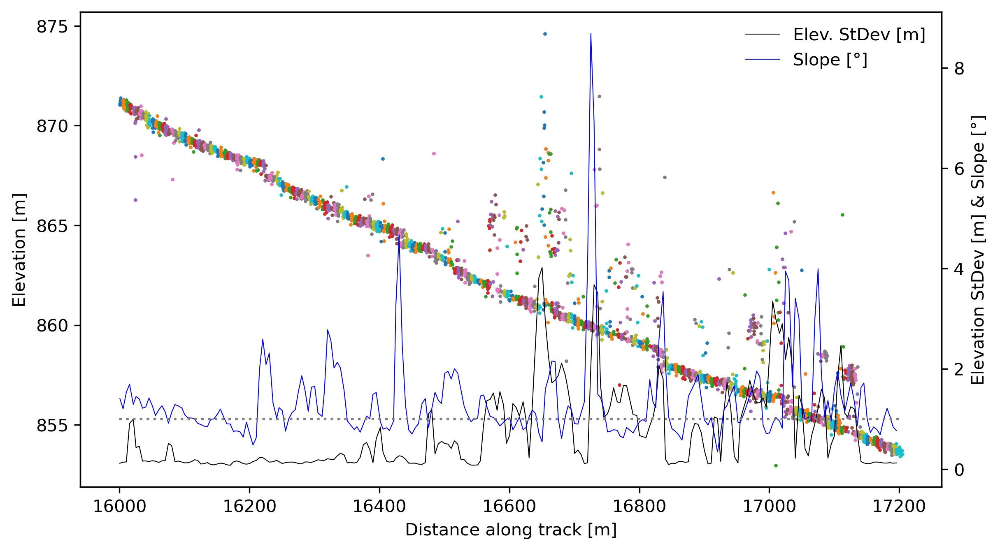

In [23]:
# defining difficult areas - areas that have low slope but high height stdev --> trees, buildings, etc

fig, ax = plt.subplots(figsize=(9,5))
new_elev_var = []
new_mean_slope = []
x_plot = []
for i in np.arange(3200,3440):
    j = iter_array[i]
    sub_ii, = np.where((xz[:,0] >= j) & (xz[:,0] < j+10))
    xz_bin = xz[sub_ii,:]
    new_elev_var.append(elev_std[i])
    x_plot.append(xz_bin[0,0]) 
    new_mean_slope.append(mean_slope[i])
    
    ax.scatter(xz_bin[:,0], (xz_bin[:,1]), s=1)

    
    
axt = ax.twinx()
axt.plot(x_plot, new_elev_var, c='k', lw=0.5, label='Elev. StDev [m]');
axt.plot(x_plot, new_mean_slope, c='b', lw=0.5, label='Slope [°]');
axt.hlines(1,16000,17200, linestyles='dotted', colors='grey')
ax.set_xlabel('Distance along track [m]')
ax.set_ylabel('Elevation [m]')
axt.set_ylabel('Elevation StDev [m] & Slope [°]')
axt.legend(frameon=False);
fig.set_dpi(300)
plt.savefig('../writing/img/slope_elevvar.png', bbox_inches='tight', dpi=300)

### second percentile filtering

In [40]:
array_train = np.arange(0, len(iter_array))

filtered_ind_gr = []
p_veg, = np.where((mean_slope < 10) & (elev_std > 1))
for j in array_train:
    k = iter_array[j]
    sub_ii, = np.where((xz[:,0] >= k) & (xz[:,0] < k+10))
    xz_bin = xz[sub_ii,:]
    
    if j in p_veg:
        xz_detrend = signal.detrend(xz_bin[:,1])
        ind_ground, = np.where((xz_detrend >= np.nanpercentile(xz_detrend, 0.5)) & (xz_detrend < np.nanpercentile(xz_detrend, 20)))
        filtered_ind_gr.append(sub_ii[ind_ground])
    else:
        xz_detrend = signal.detrend(xz_bin[:,1])
        ind_ground, = np.where((xz_detrend >= np.nanpercentile(xz_detrend, 0.5)) & (xz_detrend < np.nanpercentile(xz_detrend, 80)))
        filtered_ind_gr.append(sub_ii[ind_ground])


df_ind_gr = np.unique(np.concatenate(filtered_ind_gr))
gdfx = gdf.iloc[df_ind_gr]
print(len(gdfx))

with warnings.catch_warnings():
    warnings.simplefilter('ignore', category=UserWarning)
    gdfx.to_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_mixed_all.shp')

58237


In [95]:
gdf_notfiltered = gp.read_file('../data/beams/SGM/SAF_20220901_GT3R_10_5m_p80_all.shp')

In [96]:
t = np.arange(gdf_notfiltered.alongtrack.iloc[0]+1, gdf_notfiltered.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf_notfiltered.alongtrack)))).tolist()
spl = LSQUnivariateSpline(gdf_notfiltered.alongtrack, gdf_notfiltered.PhH_navd88, t)
gdf_notfiltered = gdf_notfiltered.drop(index=np.where((gdf_notfiltered.alongtrack >19090) & (gdf_notfiltered.alongtrack < 19460))[0])
diff_spl = gdf_notfiltered.dem_1m_nav - spl(gdf_notfiltered.alongtrack)
print(f'Only 80:  Spline MdSE = {np.nanmedian((diff_spl)**2):.3f}')
print(f'Only 80:  Spline IQR = {iqr(diff_spl):.3f}')

diff = gdf_notfiltered.dem_1m_nav - gdf_notfiltered.PhH_navd88

print(f'Only 80: Photon MdSE = {np.nanmedian((diff)**2):.3f}')
print(f'Only 80:  Photon IQR = {iqr(diff):.3f}\n')

print(len(gdf_notfiltered))

Only 80:  Spline MdSE = 0.065
Only 80:  Spline IQR = 0.504
Only 80: Photon MdSE = 0.096
Only 80:  Photon IQR = 0.631

59692


In [97]:
gdf_filtered = gp.read_file('../data/beams/SGM/SAF_20220901_GT3R_10_5m_mixed_all.shp')
gdf_filtered.shape

(58237, 12)

In [98]:
t = np.arange(gdf_filtered.alongtrack.iloc[0]+1, gdf_filtered.alongtrack.iloc[-1]-1, np.ceil(np.max(np.diff(gdf_filtered.alongtrack)))).tolist()
spl = LSQUnivariateSpline(gdf_filtered.alongtrack, gdf_filtered.PhH_navd88, t)
gdf_filtered = gdf_filtered.drop(index=np.where((gdf_filtered.alongtrack >19090) & (gdf_filtered.alongtrack < 19460))[0])
diff_spl = gdf_filtered.dem_1m_nav - spl(gdf_filtered.alongtrack)
print(f'Filtered:  Spline MdSE = {np.nanmedian((diff_spl)**2):.3f}')
print(f'Filtered:  Spline IQR = {iqr(diff_spl):.3f}')

diff = gdf_filtered.dem_1m_nav - gdf_filtered.PhH_navd88

print(f'Filtered: Photon MdSE = {np.nanmedian((diff)**2):.3f}')
print(f'Filtered:  Photon IQR = {iqr(diff):.3f}\n')

print(len(gdf_filtered))

Filtered:  Spline MdSE = 0.064
Filtered:  Spline IQR = 0.518
Filtered: Photon MdSE = 0.098
Filtered:  Photon IQR = 0.641

57353


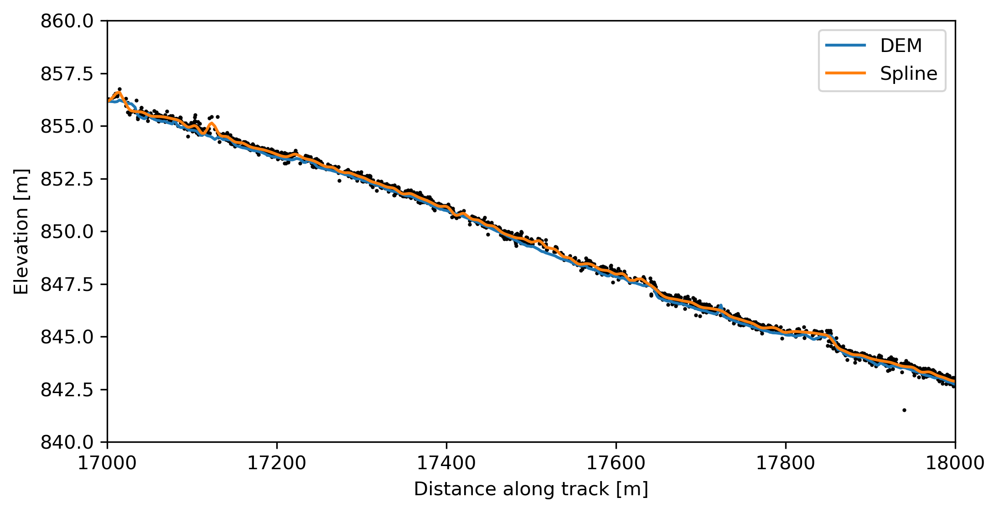

In [102]:
gdf_filtered = gp.read_file('../data/beams/SGM/SAF_20220901_GT3R_10_5m_mixed_all.shp')
fig, ax = plt.subplots(figsize=(8,4))
ax.scatter(gdf_filtered.alongtrack, gdf_filtered.PhH_navd88, s=1, c='k');
ax.plot(gdf_filtered.alongtrack, gdf_filtered.dem_1m_nav, label='DEM')

t = np.arange(gdf_filtered.alongtrack.iloc[0]+5, gdf_filtered.alongtrack.iloc[-1]-5, np.ceil(np.max(np.diff(gdf_filtered.alongtrack)))).tolist()
spl = LSQUnivariateSpline(gdf_filtered.alongtrack, gdf_filtered.PhH_navd88, t)
ax.plot(gdf_filtered.alongtrack, spl(gdf_filtered.alongtrack), label='Spline')
ax.legend()
ax.set_xlim(17000,18000);
ax.set_ylim(840,860);
ax.set_xlabel('Distance along track [m]')
ax.set_ylabel('Elevation [m]')
#ax.set_title(f'Threshold = {i}th percentile');
fig.set_dpi(300);
plt.savefig('../writing/img/perc_outcome_80_20.png', bbox_inches='tight', dpi=300)

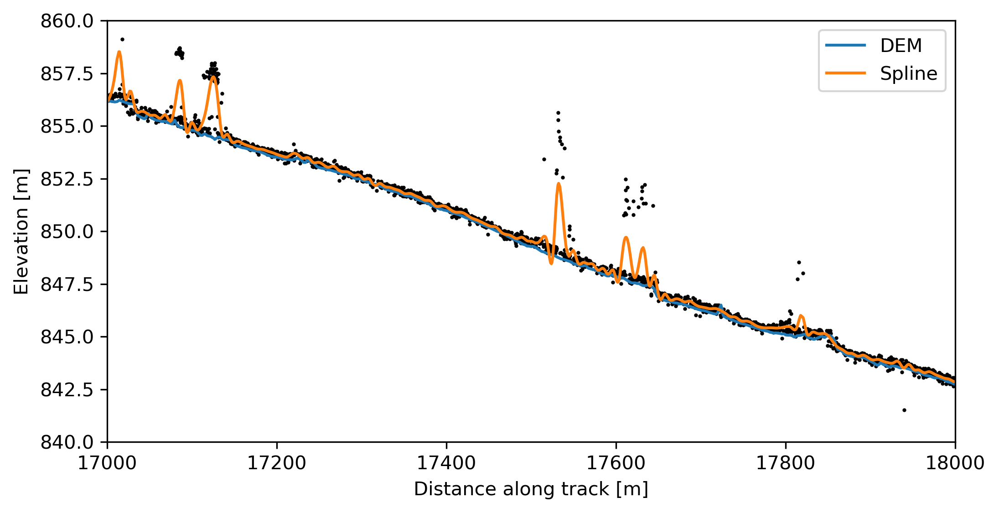

In [106]:
gdf_filtered = gp.read_file('../data/beams/SGM/SAF_20220901_GT3R_10_5m_p80_all.shp')
fig, ax = plt.subplots(figsize=(8,4))
ax.scatter(gdf_filtered.alongtrack, gdf_filtered.PhH_navd88, s=1, c='k');
ax.plot(gdf_filtered.alongtrack, gdf_filtered.dem_1m_nav, label='DEM')

t = np.arange(gdf_filtered.alongtrack.iloc[0]+5, gdf_filtered.alongtrack.iloc[-1]-5, np.ceil(np.max(np.diff(gdf_filtered.alongtrack)))).tolist()
spl = LSQUnivariateSpline(gdf_filtered.alongtrack, gdf_filtered.PhH_navd88, t)
ax.plot(gdf_filtered.alongtrack, spl(gdf_filtered.alongtrack), label='Spline')
ax.legend()
ax.set_xlim(17000,18000);
ax.set_ylim(840,860);
ax.set_xlabel('Distance along track [m]')
ax.set_ylabel('Elevation [m]')
fig.set_dpi(300);
plt.savefig('../writing/img/perc_outcome_80.png', bbox_inches='tight', dpi=300)

In [ ]:
np.save('../data/ground/Perc/Percentile_GP_index.npy', df_ind_gr)

9.0


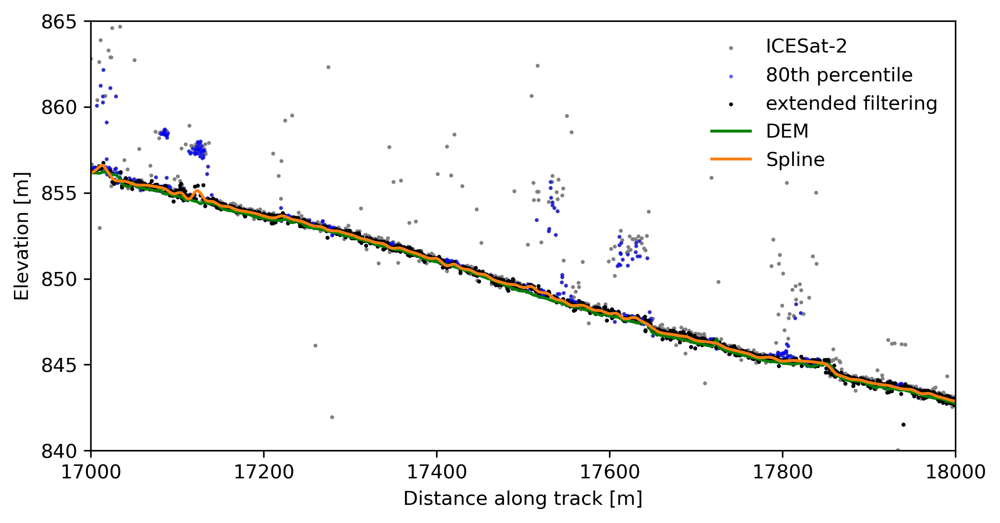

In [100]:
fig, ax = plt.subplots(figsize=(8,4))
fig.set_dpi(300)

ax.scatter(gdf.alongtrack, gdf.PhH_navd88, s=1, c='grey', label='ICESat-2');

gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_p80_all.shp')
ax.scatter(gdf2.alongtrack, gdf2.PhH_navd88, s=1, c='b', label='80th percentile', alpha=0.5);

gdf2 = gp.read_file(f'../data/beams/SGM/SAF_20220901_GT3R_10_5m_mixed_all.shp')
ax.scatter(gdf2.alongtrack, gdf2.PhH_navd88, s=1, c='k', label='extended filtering');
ax.plot(gdf2.alongtrack, gdf2.dem_1m_nav, label='DEM', c='g')

t = np.arange(gdf2.alongtrack.iloc[0]+5, gdf2.alongtrack.iloc[-1]-5, np.ceil(np.max(np.diff(gdf2.alongtrack)))).tolist()
print(np.ceil(np.max(np.diff(gdf2.alongtrack))))
spl = LSQUnivariateSpline(gdf2.alongtrack, gdf2.PhH_navd88, t)
ax.plot(gdf2.alongtrack, spl(gdf2.alongtrack), label='Spline', c='tab:orange')

ax.legend(frameon=False)
ax.set_xlim(17000,18000);
ax.set_ylim(840,865);
ax.set_xlabel('Distance along track [m]')
ax.set_ylabel('Elevation [m]')

plt.savefig('../writing/img/perc_outcome.png', bbox_inches='tight', dpi=300)